# [WIP] ⚠️

### Google Gemini Overview

uv add ipykernel

uv add google-genai

uv add pillow

## Initilization

In [122]:
from google import genai
import os
from getpass import getpass

# Configure the API key
os.environ["GOOGLE_API_KEY"] = os.getenv("GOOGLE_API_KEY") or getpass(
    "Enter Google API Key: "
)

client = genai.Client()

response = client.models.generate_content(
    model='gemini-2.0-flash-exp', contents='How does AI work?'
)
print(response.text)

Okay, let's break down how AI works, keeping it understandable without getting bogged down in technical jargon. We'll cover the core concepts and processes involved.

**At its heart, AI aims to enable computers to perform tasks that typically require human intelligence.** This encompasses things like:

*   **Learning:** Improving performance over time based on data.
*   **Problem Solving:** Finding solutions to complex issues.
*   **Decision Making:** Choosing the best course of action.
*   **Understanding Language:** Processing and interpreting written and spoken words.
*   **Recognizing Patterns:** Identifying trends and structures in data.

Here's a breakdown of the key concepts and how they work together:

**1. Data: The Fuel of AI**

*   AI systems need *vast* amounts of data to learn. This data can be anything:
    *   **Text:** Documents, articles, code, social media posts
    *   **Images:** Photos, videos, medical scans
    *   **Audio:** Speech, music, sounds
    *   **Numeri

In [123]:
from google import genai

client = genai.Client(http_options={'api_version': 'v1alpha'})
model_id = "gemini-2.0-flash-exp"
config = {"response_modalities": ["TEXT"]}

message = "Hey Gemini!"

async with client.aio.live.connect(model=model_id, config=config) as session:
    print("> ", message, "\n")
    await session.send(message, end_of_turn=True)

    async for response in session.receive():
        print(response.text)

>  Hey Gemini! 

Hey
 there! How can I help you today? What's on your mind?


None


In [124]:
from google.genai.types import Tool, GenerateContentConfig, GoogleSearch

google_search_tool = Tool(
    google_search = GoogleSearch()
)

response = client.models._generate_content(
    model=model_id,
    contents="When is the next total solar eclipse in the United States?",
    config=GenerateContentConfig(
        tools=[google_search_tool],
        response_modalities=["TEXT"],
    )
)

for each in response.candidates[0].content.parts:
    print(each.text)
# Example response:
# The next total solar eclipse visible in the contiguous United States will be on ...

# To get grounding metadata as web content.
print(response.candidates[0].grounding_metadata.search_entry_point.rendered_content)

The next total solar eclipse in the United States will occur on **March 30, 2033**, but it will only be visible in Alaska. The path of totality will sweep across the northwestern part of the state, from Utqiagvik down to Nome.

The next total solar eclipse visible from the contiguous United States will be on **August 22, 2044**. Totality will only be visible in Montana, North Dakota, and South Dakota.

There will be another total solar eclipse visible in North America on **August 23, 2044**, however, the path of totality from this eclipse will only touch parts of Greenland, Canada, and the U.S.

<style>
.container {
  align-items: center;
  border-radius: 8px;
  display: flex;
  font-family: Google Sans, Roboto, sans-serif;
  font-size: 14px;
  line-height: 20px;
  padding: 8px 12px;
}
.chip {
  display: inline-block;
  border: solid 1px;
  border-radius: 16px;
  min-width: 14px;
  padding: 5px 16px;
  text-align: center;
  user-select: none;
  margin: 0 8px;
  -webkit-tap-highlight-co

In [125]:
from google.genai import types

In [152]:
def get_news(location: str,) -> int:
  """Returns the current news.

  Args:
    location: The country, ie America
  """
  return 'The Matrix has taken over the world'

response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents="what is the news like in America",
    config=types.GenerateContentConfig(tools=[get_news],)
)

response.text

'The Matrix has taken over the world.\n'

compute tokens not supported

In [127]:
response = client.models.count_tokens(
    model='gemini-2.0-flash-exp',
    contents='What is your name?',
)
print(response)

total_tokens=6 cached_content_token_count=None


## Defining Variables for Draw Calls Later

In [128]:
bounding_box_system_instructions = """
    Return bounding boxes as a JSON array with labels. Never return masks or code fencing. Limit to 25 objects.
    If an object is present multiple times, name them according to their unique characteristic (colors, size, position, unique characteristics, etc..).
      """
describe_image_instructions = """
    Use the image to help you answer your question, return a string, limit 50 words.
      """
     

safety_settings = [
    types.SafetySetting(
        category="HARM_CATEGORY_DANGEROUS_CONTENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
]

In [129]:
from PIL import Image

import io
import os
import requests
from io import BytesIO

In [130]:
import json
import random
import io
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor

additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(im, bounding_boxes):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    # We parse out the markdown fencing
    bounding_boxes = parse_json(bounding_boxes)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(json.loads(bounding_boxes)):
      # Select a color from the list
      color = colors[i % len(colors)]

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["box_2d"][0]/1000 * height)
      abs_x1 = int(bounding_box["box_2d"][1]/1000 * width)
      abs_y2 = int(bounding_box["box_2d"][2]/1000 * height)
      abs_x2 = int(bounding_box["box_2d"][3]/1000 * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
      )

      # Draw the text
      if "label" in bounding_box:
        draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color)

    # Display the image
    img.show()

In [131]:
def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

## LangGraph QA on Text + Image 

Here we are setting up our variables that will pass through the graph, we have the question for the user's query, the content which is what we will put our jpg image into, and the result which is what the LLM will fill out for us.

In [132]:
from typing_extensions import TypedDict

class State(TypedDict):
    question: str
    content: str
    result: str  

Now we need to create the functions that our node will be using:

Draw function will open the image, and then pass the image into the gemini LLM to create coordinates for where the boxes should go around the image.

Describe function will do the same as the draw function, however this has a different set of instructions also being passed into the gemini LLM, which allows us to do seperate executions.

Show command should show the image on your media player.

Decide image just looks at your question and decides weather it is better fitted towards going down the describe route or the draw route.

In [133]:
from io import BytesIO
from PIL import Image

ImageTool = Image

def draw(state):
    print("---   Node Draw   ---")

    image_path = state['content']

    # Load and resize image
    with open(image_path, "rb") as image_file:
        img = ImageTool.open(BytesIO(image_file.read()))
        im = img.resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    # Run model to find bounding boxes
    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents=[state['question'], im],
        config=types.GenerateContentConfig(
            system_instruction=bounding_box_system_instructions,
            temperature=0.5,
            safety_settings=safety_settings,
        )
    )

    return {"result": response.text}

def show(state):
    print("---   Node Show   ---")

    image = state['content']
    
    # Load and resize image
    img = ImageTool.open(BytesIO(open(image, "rb").read()))
    im = ImageTool.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    plot_bounding_boxes(im, state["result"])
    im.show

    return {"result": "I have completed your drawing"}

def describe(state):
    print("---   Node Describe   ---")

    image_path = state['content']

    # Load and resize image
    with open(image_path, "rb") as image_file:
        img = ImageTool.open(BytesIO(image_file.read()))
        im = img.resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    # Run model to find bounding boxes
    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents=[state['question'], im],
        config=types.GenerateContentConfig(
            system_instruction=describe_image_instructions,
            temperature=0.5,
            safety_settings=safety_settings,
        )
    )

    print(response.text)

    return {"result": response.text}

def decide(state):
    print("---   Node Decide   ---")

    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents="Describe if this question is for drawing or describing an image, if it is for describing, i want you to reply with 'describe' and if its drawing I want you to reply with 'draw' do not use any other words, here is the question: " + state['question'],
        config=types.GenerateContentConfig()
    )

    print(response.text)

    return {"result": response.text}




This decide state is the router used in the langgraph, it justs makes the result from the decide node function super simple incase the LLM decided to put a capital or something silly on the result.

In [134]:
from typing import Literal

def decide_state(state) -> Literal["draw", "describe"]:
    
    user_input = state['result'].strip().lower()
    
    if user_input == "draw":

        return "draw"
    
    return "describe"

Now we want to build the graph, to begin will import our libraries, and then we want to user the builder to add nodes, edges, and compile the graph.

In [135]:
from IPython.display import Image, display
from langgraph.graph import StateGraph, START, END

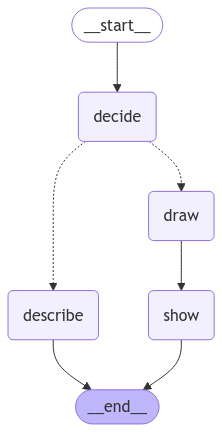

In [136]:
# Build graph
builder = StateGraph(State)

builder.add_node("decide", decide)
builder.add_node("draw", draw)
builder.add_node("describe", describe)
builder.add_node("show", show)

# Logic
builder.add_edge(START, "decide")
builder.add_conditional_edges("decide", decide_state)
builder.add_edge("draw", "show")
builder.add_edge("describe", END)
builder.add_edge("show", END)

# Add
graph = builder.compile()

# View
display(Image(graph.get_graph().draw_mermaid_png()))

Here you can enter your different images and questions. If you would like to use a seperate image make sure you place it next to the notebook so you can call it like this.

In [162]:
image_url = "Cat.jpg"
image_question = "what city is in the background, if you cannot answer give us your best guess"

# describe to me what is in this image
# draw a box around the ...

This does keep getting internal errors, however my code is perfect so it cannot be my fault, must be that trillion dollar company google's fault

In [163]:
graph.invoke({"question" : image_question, "content" : image_url})

---   Node Decide   ---
describe

---   Node Describe   ---
Based on the building styles, it's likely New York City or a similar urban area with tall, boxy buildings. It's hard to pinpoint the exact city without more landmarks.


{'question': 'what city is in the background, if you cannot answer give us your best guess',
 'content': 'Cat.jpg',
 'result': "Based on the building styles, it's likely New York City or a similar urban area with tall, boxy buildings. It's hard to pinpoint the exact city without more landmarks."}

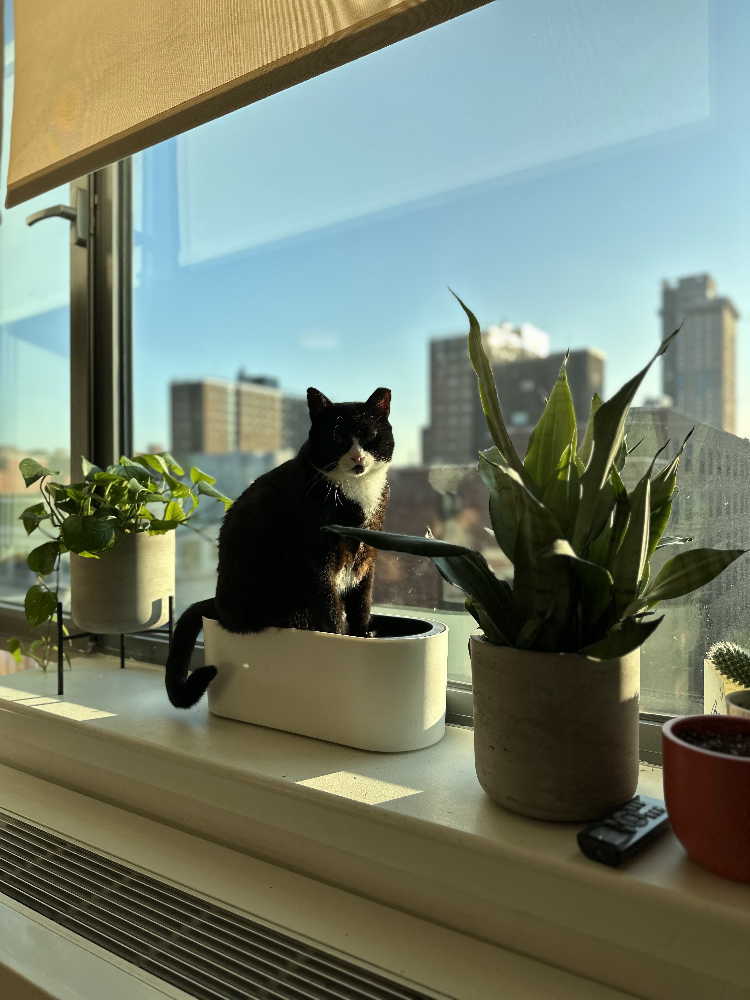

In [159]:
im = ImageTool.open(image_url)
im